<a href="https://colab.research.google.com/github/ph-nhu-24/Breast_Cancer/blob/main/A_gene_panel_sequencing_dataset_of_a_cancer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Setup working directory

In [ ]:
!mkdir 01_raw
!mkdir 02_trim
!mkdir 03_align
!mkdir 00_ref

## Install tools

### Install fastqc

In [ ]:
!wget https://www.bioinformatics.babraham.ac.uk/projects/fastqc/fastqc_v0.12.1.zip

--2025-02-03 06:10:41--  https://www.bioinformatics.babraham.ac.uk/projects/fastqc/fastqc_v0.12.1.zip
Resolving www.bioinformatics.babraham.ac.uk (www.bioinformatics.babraham.ac.uk)... 149.155.133.4
Connecting to www.bioinformatics.babraham.ac.uk (www.bioinformatics.babraham.ac.uk)|149.155.133.4|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11709692 (11M) [application/zip]
Saving to: ‘fastqc_v0.12.1.zip’

fastqc_v0.12.1.zip  100%[===================>]  11.17M  10.7MB/s    in 1.0s    

2025-02-03 06:10:43 (10.7 MB/s) - ‘fastqc_v0.12.1.zip’ saved [11709692/11709692]



In [ ]:
!unzip -q fastqc_v0.12.1.zip
!chmod +x FastQC/fastqc
!ln -s /content/FastQC/fastqc /usr/local/bin/fastqc

ln: failed to create symbolic link '/usr/local/bin/fastqc': File exists


### Install BWA

In [ ]:
!apt-get update
!apt-get install -y bwa

Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:2 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:5 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:7 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:10 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,306 kB]
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:12 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 Packages [2,904 kB]
Get:13 http://archive.ubuntu.com/ubuntu jamm

## Quality Control - FASTQC

In [ ]:
!for file in `ls ./01_raw/*.gz`; do fastqc $file -o ./01_raw; done

application/gzip
Started analysis of V300037010A7_1.fq.gz
Approx 5% complete for V300037010A7_1.fq.gz
Approx 10% complete for V300037010A7_1.fq.gz
Approx 15% complete for V300037010A7_1.fq.gz
Approx 20% complete for V300037010A7_1.fq.gz
Approx 25% complete for V300037010A7_1.fq.gz
Approx 30% complete for V300037010A7_1.fq.gz
Approx 35% complete for V300037010A7_1.fq.gz
Approx 40% complete for V300037010A7_1.fq.gz
Approx 45% complete for V300037010A7_1.fq.gz
Approx 50% complete for V300037010A7_1.fq.gz
Approx 55% complete for V300037010A7_1.fq.gz
Approx 60% complete for V300037010A7_1.fq.gz
Approx 65% complete for V300037010A7_1.fq.gz
Approx 70% complete for V300037010A7_1.fq.gz
Approx 75% complete for V300037010A7_1.fq.gz
Approx 80% complete for V300037010A7_1.fq.gz
Approx 85% complete for V300037010A7_1.fq.gz
Approx 90% complete for V300037010A7_1.fq.gz
Approx 95% complete for V300037010A7_1.fq.gz
Analysis complete for V300037010A7_1.fq.gz
application/gzip
Started analysis of V3000370

## Alignment: Mapping reads to reference genome

### Download Reference hg19 (GRCh37)

In [ ]:
!wget https://hgdownload.soe.ucsc.edu/goldenPath/hg19/bigZips/hg19.fa.gz -O ./00_ref/hg19.fa.gz

--2025-02-03 02:29:01--  https://hgdownload.soe.ucsc.edu/goldenPath/hg19/bigZips/hg19.fa.gz
Resolving hgdownload.soe.ucsc.edu (hgdownload.soe.ucsc.edu)... 128.114.119.163
Connecting to hgdownload.soe.ucsc.edu (hgdownload.soe.ucsc.edu)|128.114.119.163|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 948731419 (905M) [application/x-gzip]
Saving to: ‘./00_ref/hg19.fa.gz’

./00_ref/hg19.fa.gz 100%[===================>] 904.78M  61.9MB/s    in 15s     

2025-02-03 02:29:17 (61.6 MB/s) - ‘./00_ref/hg19.fa.gz’ saved [948731419/948731419]



#### Unzip hg19 fasta

In [ ]:
!gunzip -q ./00_ref/hg19.fa.gz

## Set up environment and tools
### Conda colab

In [ ]:
!pip install condacolab
import condacolab
condacolab.install()

⏬ Downloading https://github.com/jaimergp/miniforge/releases/download/24.11.2-1_colab/Miniforge3-colab-24.11.2-1_colab-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:18
🔁 Restarting kernel...


In [ ]:
!conda install -c bioconda samtools

Channels:
 - bioconda
 - conda-forge
Platform: linux-64
Solving environment: \ | / - \ | / - done

# All requested packages already installed.



In [ ]:
!sudo apt-get update
!sudo apt-get install samtools

Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:2 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:4 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:7 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Fetched 257 kB in 1s (175 kB/s)
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package list

#### Index fasta file

In [ ]:
!samtools faidx /content/00_ref/hg19.fa

## GATK4

In [ ]:
%%shell
apt-get update -qq && apt-get upgrade -qq -y
apt-get install -qq build-essential gawk
apt autoremove -qq && apt autoclean -qq
conda update --all --quiet

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Preconfiguring packages ...
(Reading database ... 124950 files and directories currently installed.)
Preparing to unpack .../base-files_12ubuntu4.7_amd64.deb ...
Unpacking base-files (12ubuntu4.7) over (12ubuntu4.6) ...
Setting up base-files (12ubuntu4.7) ...
Installing new version of config file /etc/issue ...
Installing new version of config file /etc/issue.net ...
Installing new version of config file /etc/lsb-release ...
(Reading database ... 124950 files and directories currently installed.)
Preparing to unpack .../libpam0g_1.4.0-11ubuntu2.5_amd64.deb ...
Unpacking libpam0g:amd64 (1.4.0-11ubuntu2.5) over (1.4.0-11ubuntu2.4) ...
Setting up libpam0g:amd64 (1.4.0-11ubuntu2.5) ...
(Reading database ... 124950 files and directories currently installed.)
Preparing to unpack .../libpam-modules-bin_1.4.

In [ ]:
!mamba install bioconda::bcftools

[+] 0.0s
[+] 0.1s
bioconda/linux-64 ..  ⣾  
bioconda/noarch (c..  ⣾  [+] 0.0s
[+] 0.1s
conda-forge/linux-64   1%
conda-forge/noarch    |  
bioconda/linux-64     |  
bioconda/noarch       |  [+] 0.2s
conda-forge/linux-64   2%
conda-forge/noarch     4%
bioconda/linux-64     10%
bioconda/noarch        5%[+] 0.3s
conda-forge/linux-64   4%
conda-forge/noarch     6%
bioconda/linux-64     28%
bioconda/noarch       22%[+] 0.4s
conda-forge/linux-64   5%
conda-forge/noarch    11%
bioconda/linux-64     46%
bioconda/noarch       41%[+] 0.5s
conda-forge/linux-64   7%
conda-forge/noarch    12%
bioconda/linux-64     52%
bioconda/noarch       49%[+] 0.6s
conda-forge/linux-64   8%
conda-forge/noarch    17%
bioconda/linux-64     69%
bioconda/noarch       68%[+] 0.7s
conda-forge/linux-64  10%
conda-forge/noarch    20%
bioconda/linux-64     79%
bioconda/noarch       79%[+] 0.8s
conda-forge/linux-64  13%
conda-forge/noarch    25%
bioconda/linux-64     97%
bioconda/noarch       98%[+] 0.9s
conda-forge/linux

In [ ]:
%%shell
conda create -n gatk_env bioconda::gatk4
mamba install -c bioconda fastqc fastp samtools sra-tools multiqc htslib entrez-direct

Channels:
 - conda-forge
 - bioconda
Platform: linux-64
Solving environment: - done

## Package Plan ##

  environment location: /usr/local/envs/gatk_env

  added / updated specs:
    - bioconda::gatk4


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    alsa-lib-1.2.13            |       hb9d3cd8_0         547 KB  conda-forge
    cairo-1.18.2               |       h3394656_1         956 KB  conda-forge
    font-ttf-dejavu-sans-mono-2.37|       hab24e00_0         388 KB  conda-forge
    font-ttf-inconsolata-3.000 |       h77eed37_0          94 KB  conda-forge
    font-ttf-source-code-pro-2.038|       h77eed37_0         684 KB  conda-forge
    font-ttf-ubuntu-0.83       |       h77eed37_3         1.5 MB  conda-forge
    fontconfig-2.15.0          |       h7e30c49_1         259 KB  conda-forge
    fonts-conda-ecosystem-1    |                0           4 KB  conda-forge
    fonts-conda-forg

In [ ]:
%%shell
source activate gatk_env
gatk --version

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar --version
The Genome Analysis Toolkit (GATK) v4.6.1.0
HTSJDK Version: 4.1.3
Picard Version: 3.3.0


#### Create sequence dictionary

In [ ]:
%%shell
source activate gatk_env
gatk CreateSequenceDictionary -R /content/00_ref/hg19.fa -O /content/00_ref/hg19.dict

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar CreateSequenceDictionary -R /content/00_ref/hg19.fa -O /content/00_ref/hg19.dict
03:00:36.943 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
[Mon Feb 03 03:00:36 UTC 2025] CreateSequenceDictionary --OUTPUT /content/00_ref/hg19.dict --REFERENCE /content/00_ref/hg19.fa --TRUNCATE_NAMES_AT_WHITESPACE true --NUM_SEQUENCES 2147483647 --VERBOSITY INFO --QUIET false --VALIDATION_STRINGENCY STRICT --COMPRESSION_LEVEL 2 --MAX_RECORDS_IN_RAM 500000 --CREATE_INDEX false --CREATE_MD5_FILE false --help false --v

#### First, Index the reference genome

In [ ]:
!bwa index -a bwtsw ./00_ref/hg19.fa

[bwa_index] Pack FASTA... 37.40 sec
[bwa_index] Construct BWT for the packed sequence...
[BWTIncCreate] textLength=6274322528, availableWord=453484340
[BWTIncConstructFromPacked] 10 iterations done. 100000000 characters processed.
[BWTIncConstructFromPacked] 20 iterations done. 200000000 characters processed.
[BWTIncConstructFromPacked] 30 iterations done. 300000000 characters processed.
[BWTIncConstructFromPacked] 40 iterations done. 400000000 characters processed.
[BWTIncConstructFromPacked] 50 iterations done. 500000000 characters processed.
[BWTIncConstructFromPacked] 60 iterations done. 600000000 characters processed.
[BWTIncConstructFromPacked] 70 iterations done. 700000000 characters processed.
[BWTIncConstructFromPacked] 80 iterations done. 800000000 characters processed.
[BWTIncConstructFromPacked] 90 iterations done. 900000000 characters processed.
[BWTIncConstructFromPacked] 100 iterations done. 1000000000 characters processed.
[BWTIncConstructFromPacked] 110 iterations done

## Align with BWA mem

In [ ]:
# Align with BWA mem, using 4 threads
!bwa mem -t 4 \
-R '@RG\tID:chr2\tSM:V300037010A\tPL:illumina\tLB:lib1\tPU:H7AP8ADXX:1:TAAGGCGA' \
00_ref/hg19.fa \
01_raw/V300037010A7_1.fq.gz \
01_raw/V300037010A7_2.fq.gz > 03_align/V300037010A7_aln.sam

[M::bwa_idx_load_from_disk] read 0 ALT contigs
[M::process] read 400000 sequences (40000000 bp)...
[M::process] read 400000 sequences (40000000 bp)...
[M::mem_pestat] # candidate unique pairs for (FF, FR, RF, RR): (1, 183506, 0, 1)
[M::mem_pestat] skip orientation FF as there are not enough pairs
[M::mem_pestat] analyzing insert size distribution for orientation FR...
[M::mem_pestat] (25, 50, 75) percentile: (148, 160, 171)
[M::mem_pestat] low and high boundaries for computing mean and std.dev: (102, 217)
[M::mem_pestat] mean and std.dev: (158.75, 14.03)
[M::mem_pestat] low and high boundaries for proper pairs: (79, 240)
[M::mem_pestat] skip orientation RF as there are not enough pairs
[M::mem_pestat] skip orientation RR as there are not enough pairs
[M::mem_process_seqs] Processed 400000 reads in 89.878 CPU sec, 69.118 real sec
[M::process] read 400000 sequences (40000000 bp)...
[M::mem_pestat] # candidate unique pairs for (FF, FR, RF, RR): (0, 183652, 0, 0)
[M::mem_pestat] skip orien

### Alignment file - Convert SAM to BAM
#### Binary compressed of .sam file is .bam, which is less heavier than .sam:

In [ ]:
!samtools view -Sb 03_align/V300037010A7_aln.sam \
> 03_align/V300037010A7_aln.bam
#!rm 03_align/V300037010A7_aln.sam

### Flagstat
#### The flagstat function of SAMtools provides a summary of the number of records corresponding to each of the bit flags.

In [ ]:
!samtools flagstat 03_align/V300037010A7_aln.bam

8994980 + 0 in total (QC-passed reads + QC-failed reads)
8993562 + 0 primary
0 + 0 secondary
1418 + 0 supplementary
0 + 0 duplicates
0 + 0 primary duplicates
8682717 + 0 mapped (96.53% : N/A)
8681299 + 0 primary mapped (96.53% : N/A)
8993562 + 0 paired in sequencing
4496781 + 0 read1
4496781 + 0 read2
8529398 + 0 properly paired (94.84% : N/A)
8662242 + 0 with itself and mate mapped
19057 + 0 singletons (0.21% : N/A)
9182 + 0 with mate mapped to a different chr
7771 + 0 with mate mapped to a different chr (mapQ>=5)


## Mapped reads post-processing
🌟 [Hands-on]: Use GATK to analyze data
### Sorting and marking duplicate, inxdexing the BAM file

### SortSam

In [ ]:
%%shell
source activate gatk_env
gatk SortSam \
--INPUT 03_align/V300037010A7_aln.bam \
--OUTPUT 03_align/V300037010A7_sorted.bam \
--SORT_ORDER coordinate

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar SortSam --INPUT 03_align/V300037010A7_aln.bam --OUTPUT 03_align/V300037010A7_sorted.bam --SORT_ORDER coordinate
14:27:35.795 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
[Sun Feb 02 14:27:35 UTC 2025] SortSam --INPUT 03_align/V300037010A7_aln.bam --OUTPUT 03_align/V300037010A7_sorted.bam --SORT_ORDER coordinate --VERBOSITY INFO --QUIET false --VALIDATION_STRINGENCY STRICT --COMPRESSION_LEVEL 2 --MAX_RECORDS_IN_RAM 500000 --CREATE_INDEX false --CREATE_MD5_FILE false --help false --version false --s

### MarkDuplicates
Detect duplicate using GATK.

In [ ]:
%%shell
source activate gatk_env
gatk MarkDuplicates \
--INPUT 03_align/V300037010A7_sorted.bam \
--OUTPUT 03_align/V300037010A7_aln_dedup.bam \
--METRICS_FILE 03_align/V300037010A7_MarkDup.metrics

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar MarkDuplicates --INPUT 03_align/V300037010A7_sorted.bam --OUTPUT 03_align/V300037010A7_aln_dedup.bam --METRICS_FILE 03_align/V300037010A7_MarkDup.metrics
14:41:06.330 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
[Sun Feb 02 14:41:06 UTC 2025] MarkDuplicates --INPUT 03_align/V300037010A7_sorted.bam --OUTPUT 03_align/V300037010A7_aln_dedup.bam --METRICS_FILE 03_align/V300037010A7_MarkDup.metrics --MAX_SEQUENCES_FOR_DISK_READ_ENDS_MAP 50000 --MAX_FILE_HANDLES_FOR_READ_ENDS_MAP 8000 --SORTING_COLLECTI

## BuildBamIndex
After remove duplicates, indexing.bam for further process

In [ ]:
%%shell
source activate gatk_env
gatk BuildBamIndex \
--INPUT 03_align/V300037010A7_aln_dedup.bam \
--OUTPUT 03_align/V300037010A7_aln_dedup.bai

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar BuildBamIndex --INPUT 03_align/V300037010A7_aln_dedup.bam --OUTPUT 03_align/V300037010A7_aln_dedup.bai
15:04:29.748 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
[Sun Feb 02 15:04:29 UTC 2025] BuildBamIndex --INPUT 03_align/V300037010A7_aln_dedup.bam --OUTPUT 03_align/V300037010A7_aln_dedup.bai --VERBOSITY INFO --QUIET false --VALIDATION_STRINGENCY STRICT --COMPRESSION_LEVEL 2 --MAX_RECORDS_IN_RAM 500000 --CREATE_INDEX false --CREATE_MD5_FILE false --help false --version false --showHidden false --

## Base Quality Score Recalibration
First, get reference:

In [ ]:
!wget -c ftp://gsapubftp-anonymous@ftp.broadinstitute.org/bundle/hg19/dbsnp_138.hg19.vcf.gz -P /content/00_ref/
#!tabix -p vcf /content/00_ref/dbsnp_138.hg19.vcf.gz

--2025-02-02 19:41:06--  ftp://gsapubftp-anonymous@ftp.broadinstitute.org/bundle/hg19/dbsnp_138.hg19.vcf.gz
           => ‘/content/00_ref/dbsnp_138.hg19.vcf.gz’
Resolving ftp.broadinstitute.org (ftp.broadinstitute.org)... 69.173.70.223
Connecting to ftp.broadinstitute.org (ftp.broadinstitute.org)|69.173.70.223|:21... connected.
Logging in as gsapubftp-anonymous ... Logged in!
==> SYST ... done.    ==> PWD ... done.
==> TYPE I ... done.  ==> CWD (1) /bundle/hg19 ... done.
==> SIZE dbsnp_138.hg19.vcf.gz ... 1470262409
File has already been retrieved.
2025-02-02 19:41:06 (0.00 B/s) - ‘/content/00_ref/dbsnp_138.hg19.vcf.gz’ saved [1470262409]

[tabix] the compression of '/content/00_ref/dbsnp_138.hg19.vcf.gz' is not BGZF


In [ ]:
!gunzip /content/00_ref/dbsnp_138.hg19.vcf.gz

In [ ]:
!bgzip /content/00_ref/dbsnp_138.hg19.vcf

In [ ]:
!tabix -p vcf /content/00_ref/dbsnp_138.hg19.vcf.gz

##### Base Quality score Recalibration:

In [ ]:
%%shell
source activate gatk_env
gatk BaseRecalibrator \
  -R /content/00_ref/hg19.fa \
  -I /content/03_align/V300037010A7_aln_dedup.bam \
  --known-sites /content/00_ref/dbsnp_138.hg19.vcf.gz \
  -O /content/03_align/V300037010A7_recal.table

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar BaseRecalibrator -R /content/00_ref/hg19.fa -I /content/03_align/V300037010A7_aln_dedup.bam --known-sites /content/00_ref/dbsnp_138.hg19.vcf.gz -O /content/03_align/V300037010A7_recal.table
19:49:50.973 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
SLF4J(W): Class path contains multiple SLF4J providers.
SLF4J(W): Found provider [org.apache.logging.slf4j.SLF4JServiceProvider@4cc12db2]
SLF4J(W): Found provider [ch.qos.logback.classic.spi.LogbackServiceProvider@5ea7bc4]
SLF4J(W): See https://www.slf4j

In [ ]:
%%shell
source activate gatk_env
gatk ApplyBQSR \
  -R /content/00_ref/hg19.fa \
  -I /content/03_align/V300037010A7_aln_dedup.bam \
  -bqsr /content/03_align/V300037010A7_recal.table \
  -O /content/03_align/V300037010A7_recal.bam

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar ApplyBQSR -R /content/00_ref/hg19.fa -I /content/03_align/V300037010A7_aln_dedup.bam -bqsr /content/03_align/V300037010A7_recal.table -O /content/03_align/V300037010A7_recal.bam
19:54:03.591 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
SLF4J(W): Class path contains multiple SLF4J providers.
SLF4J(W): Found provider [org.apache.logging.slf4j.SLF4JServiceProvider@78d73b1b]
SLF4J(W): Found provider [ch.qos.logback.classic.spi.LogbackServiceProvider@238291d4]
SLF4J(W): See https://www.slf4j.org/codes.

##### Check it again after recalibration:

In [ ]:
%%shell
source activate gatk_env
gatk BaseRecalibrator \
  -R /content/00_ref/hg19.fa \
  -I /content/03_align/V300037010A7_recal.bam \
  --known-sites /content/00_ref/dbsnp_138.hg19.vcf.gz \
  -O /content/03_align/V300037010A7_after_recal.table

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar BaseRecalibrator -R /content/00_ref/hg19.fa -I /content/03_align/V300037010A7_recal.bam --known-sites /content/00_ref/dbsnp_138.hg19.vcf.gz -O /content/03_align/V300037010A7_after_recal.table
19:59:04.536 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
SLF4J(W): Class path contains multiple SLF4J providers.
SLF4J(W): Found provider [org.apache.logging.slf4j.SLF4JServiceProvider@4cc12db2]
SLF4J(W): Found provider [ch.qos.logback.classic.spi.LogbackServiceProvider@5ea7bc4]
SLF4J(W): See https://www.slf

## Variant calling + filtering

In [ ]:
!mkdir -p "variant_calling"

### HaplotypeCaller
> Use HaplotypeCaller function in GATK to calling germline variants in samples with 53 hotspot cancer- related genes:

In [ ]:
%%shell
source activate gatk_env
samtools index /content/03_align/V300037010A7_recal.bam
gatk --java-options "-Xmx8G" HaplotypeCaller \
    --reference /content/00_ref/hg19.fa \
    --input /content/03_align/V300037010A7_recal.bam \
    --output /content/variant_calling/V300037010A7_variants.vcf \
    --intervals /content/00_ref/atoplex.cancer.53gene.amplicon.target.bed \
    -stand-call-conf 30

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -Xmx8G -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar HaplotypeCaller --reference /content/00_ref/hg19.fa --input /content/03_align/V300037010A7_recal.bam --output /content/variant_calling/V300037010A7_variants.vcf --intervals /content/00_ref/atoplex.cancer.53gene.amplicon.target.bed -stand-call-conf 30
03:02:43.646 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
SLF4J(W): Class path contains multiple SLF4J providers.
SLF4J(W): Found provider [org.apache.logging.slf4j.SLF4JServiceProvider@aa1bb14]
SLF4J(W): Found provider [ch.qos.logback.classic.

### Extract SNPs

In [ ]:
!mkdir -p "variant_calling/SNPs/"

In [ ]:
%%shell
source activate gatk_env
# SNPs selection
gatk SelectVariants \
        -R /content/00_ref/hg19.fa \
        -V /content/variant_calling/V300037010A7_variants.vcf \
        -O /content/variant_calling/SNPs/V300037010A7_haplotypecaller_snps.vcf.gz \
        --select-type SNP

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar SelectVariants -R /content/00_ref/hg19.fa -V /content/variant_calling/V300037010A7_variants.vcf -O /content/variant_calling/SNPs/V300037010A7_haplotypecaller_snps.vcf.gz --select-type SNP
03:09:42.624 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
SLF4J(W): Class path contains multiple SLF4J providers.
SLF4J(W): Found provider [org.apache.logging.slf4j.SLF4JServiceProvider@794240e2]
SLF4J(W): Found provider [ch.qos.logback.classic.spi.LogbackServiceProvider@74a820bf]
SLF4J(W): See https://www.slf4j.

### Filter SNPs

In [ ]:
%%shell
source activate gatk_env
gatk VariantFiltration \
-R /content/00_ref/hg19.fa \
-V /content/variant_calling/SNPs/V300037010A7_haplotypecaller_snps.vcf.gz \
-O /content/variant_calling/SNPs/V300037010A7_haplotypecaller_filtered_snps.vcf \
-filter-name "QD_filter" -filter "QD < 2.0" \
-filter-name "FS_filter" -filter "FS > 60.0" \
-filter-name "MQ_filter" -filter "MQ < 40.0" \
-filter-name "SOR_filter" -filter "SOR > 3.0" \
-filter-name "MQRankSum_filter" -filter "MQRankSum < -12.5" \
-filter-name "ReadPosRankSum_filter" -filter "ReadPosRankSum < -8.0" \
-genotype-filter-expression "DP < 30" \
-genotype-filter-name "DP_filter" \
-genotype-filter-expression "GQ < 20" \
-genotype-filter-name "GQ_filter"

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar VariantFiltration -R /content/00_ref/hg19.fa -V /content/variant_calling/SNPs/V300037010A7_haplotypecaller_snps.vcf.gz -O /content/variant_calling/SNPs/V300037010A7_haplotypecaller_filtered_snps.vcf -filter-name QD_filter -filter QD < 2.0 -filter-name FS_filter -filter FS > 60.0 -filter-name MQ_filter -filter MQ < 40.0 -filter-name SOR_filter -filter SOR > 3.0 -filter-name MQRankSum_filter -filter MQRankSum < -12.5 -filter-name ReadPosRankSum_filter -filter ReadPosRankSum < -8.0 -genotype-filter-expression DP < 30 -genotype-filter-name DP_filter -genotype-filter-expression GQ < 20 -genotype-filter-name GQ_filter
03:19:43.829 INFO  NativeLibrar

In [ ]:
!cat /content/variant_calling/SNPs/V300037010A7_haplotypecaller_filtered_snps.vcf | grep -v "^##"

#CHROM	POS	ID	REF	ALT	QUAL	FILTER	INFO	FORMAT	V300037010A
chr2	212812097	.	T	C	139.64	PASS	AC=1;AF=0.500;AN=2;BaseQRankSum=0.094;DP=34;ExcessHet=0.0000;FS=1.583;MLEAC=1;MLEAF=0.500;MQ=60.00;MQRankSum=0.000;QD=5.17;ReadPosRankSum=0.952;SOR=0.746	GT:AD:DP:FT:GQ:PL	0/1:18,9:27:DP_filter:99:147,0,373
chr3	41266101	.	C	A	86.64	PASS	AC=1;AF=0.500;AN=2;BaseQRankSum=-0.122;DP=29;ExcessHet=0.0000;FS=0.000;MLEAC=1;MLEAF=0.500;MQ=60.00;MQRankSum=0.000;QD=3.94;ReadPosRankSum=-0.681;SOR=0.344	GT:AD:DP:FT:GQ:PL	0/1:16,6:22:DP_filter:94:94,0,371
chr3	178927410	.	A	G	42.64	PASS	AC=1;AF=0.500;AN=2;BaseQRankSum=0.237;DP=50;ExcessHet=0.0000;FS=4.530;MLEAC=1;MLEAF=0.500;MQ=60.00;MQRankSum=0.000;QD=2.03;ReadPosRankSum=-0.959;SOR=0.054	GT:AD:DP:FT:GQ:PL	0/1:17,4:21:DP_filter:50:50,0,427
chr3	178947865	.	G	A	232.64	PASS	AC=1;AF=0.500;AN=2;BaseQRankSum=0.103;DP=49;ExcessHet=0.0000;FS=1.441;MLEAC=1;MLEAF=0.500;MQ=59.85;MQRankSum=0.000;QD=8.31;ReadPosRankSum=-0.849;SOR=1.022	GT:AD:DP:FT:GQ:PL	0/1:15,13:28:DP_fi

### Extract indels

In [ ]:
!mkdir -p "variant_calling/indels"

In [ ]:
%%shell
source activate gatk_env
# Short Indels selection
gatk SelectVariants \
        -R /content/00_ref/hg19.fa \
        -V /content/variant_calling/V300037010A7_variants.vcf \
        -O /content/variant_calling/indels/V300037010A7_haplotypecaller_indels.vcf.gz \
        --select-type INDEL

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar SelectVariants -R /content/00_ref/hg19.fa -V /content/variant_calling/V300037010A7_variants.vcf -O /content/variant_calling/indels/V300037010A7_haplotypecaller_indels.vcf.gz --select-type INDEL
03:57:10.824 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
SLF4J(W): Class path contains multiple SLF4J providers.
SLF4J(W): Found provider [org.apache.logging.slf4j.SLF4JServiceProvider@70b48eb3]
SLF4J(W): Found provider [ch.qos.logback.classic.spi.LogbackServiceProvider@7b8ea1db]
SLF4J(W): See https://www.

### Filter indels

In [ ]:
%%shell
source activate gatk_env
gatk VariantFiltration \
-R /content/00_ref/hg19.fa \
-V /content/variant_calling/indels/V300037010A7_haplotypecaller_indels.vcf.gz \
-O /content/variant_calling/indels/V300037010A7_haplotypecaller_filtered_indels.vcf \
-filter-name "QD_filter" -filter "QD < 2.0" \
-filter-name "FS_filter" -filter "FS > 60.0" \
-filter-name "MQ_filter" -filter "MQ < 40.0" \
-filter-name "SOR_filter" -filter "SOR > 3.0" \
-filter-name "MQRankSum_filter" -filter "MQRankSum < -12.5" \
-filter-name "ReadPosRankSum_filter" -filter "ReadPosRankSum < -8.0" \

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar VariantFiltration -R /content/00_ref/hg19.fa -V /content/variant_calling/indels/V300037010A7_haplotypecaller_indels.vcf.gz -O /content/variant_calling/indels/V300037010A7_haplotypecaller_filtered_indels.vcf -filter-name QD_filter -filter QD < 2.0 -filter-name FS_filter -filter FS > 60.0 -filter-name MQ_filter -filter MQ < 40.0 -filter-name SOR_filter -filter SOR > 3.0 -filter-name MQRankSum_filter -filter MQRankSum < -12.5 -filter-name ReadPosRankSum_filter -filter ReadPosRankSum < -8.0
03:59:58.597 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.

##Variant annotation

###Download germline annotation data sources



In [ ]:
import os
import pandas as pd

# Set environment variable to skip Compute Engine metadata check
os.environ['NO_GCE_CHECK'] = 'true'

In [ ]:
%%shell
source activate gatk_env
# Germline pre-packaged hg19 data sources
gatk FuncotatorDataSourceDownloader --germline --validate-integrity --hg19 --extract-after-download

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar FuncotatorDataSourceDownloader --germline --validate-integrity --hg19 --extract-after-download
03:32:07.271 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
SLF4J(W): Class path contains multiple SLF4J providers.
SLF4J(W): Found provider [org.apache.logging.slf4j.SLF4JServiceProvider@37d28938]
SLF4J(W): Found provider [ch.qos.logback.classic.spi.LogbackServiceProvider@7d0cd23c]
SLF4J(W): See https://www.slf4j.org/codes.html#multiple_bindings for an explanation.
SLF4J(I): Actual provider is of type [or

###SNPs annotation

In [ ]:
!mkdir -p "annotation"

In [ ]:
%%shell
source activate gatk_env
# SNPs annotation
gatk --java-options "-Xmx8G" Funcotator \
        -V /content/variant_calling/SNPs/V300037010A7_haplotypecaller_filtered_snps.vcf \
        -R /content/00_ref/hg19.fa \
        -O /content/annotation/V300037010A7_haplotypecaller_snps_filtered_ann.vcf.gz \
        --output-file-format VCF \
        --data-sources-path /content/funcotator_dataSources.v1.8.hg19.20230908g \
        --ref-version hg19 \
        --transcript-selection-mode "CANONICAL" \
        --prefer-mane-transcripts

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -Xmx8G -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar Funcotator -V /content/variant_calling/SNPs/V300037010A7_haplotypecaller_filtered_snps.vcf -R /content/00_ref/hg19.fa -O /content/annotation/V300037010A7_haplotypecaller_snps_filtered_ann.vcf.gz --output-file-format VCF --data-sources-path /content/funcotator_dataSources.v1.8.hg19.20230908g --ref-version hg19 --transcript-selection-mode CANONICAL --prefer-mane-transcripts
03:47:51.489 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
SLF4J(W): Class path contains multiple SLF4J providers.
SLF4J(

In [ ]:
!zcat /content/annotation/V300037010A7_haplotypecaller_snps_filtered_ann.vcf.gz | grep -v "^##" | head -n 10 | column -t

#CHROM  POS        ID  REF  ALT  QUAL    FILTER  INFO                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

### Indels annotation

In [ ]:
%%shell
source activate gatk_env
# Indels annotation
gatk --java-options "-Xmx8G" Funcotator \
        -V /content/variant_calling/indels/V300037010A7_haplotypecaller_filtered_indels.vcf\
        -R /content/00_ref/hg19.fa \
        -O /content/annotation/V300037010A7_haplotypecaller_indels_filtered_ann.vcf.gz \
        --output-file-format VCF \
        --data-sources-path /content/funcotator_dataSources.v1.8.hg19.20230908g \
        --ref-version hg19 \
        --transcript-selection-mode "CANONICAL" \
        --prefer-mane-transcripts

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -Xmx8G -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar Funcotator -V /content/variant_calling/indels/V300037010A7_haplotypecaller_filtered_indels.vcf -R /content/00_ref/hg19.fa -O /content/annotation/V300037010A7_haplotypecaller_indels_filtered_ann.vcf.gz --output-file-format VCF --data-sources-path /content/funcotator_dataSources.v1.8.hg19.20230908g --ref-version hg19 --transcript-selection-mode CANONICAL --prefer-mane-transcripts
04:02:43.203 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
SLF4J(W): Class path contains multiple SLF4J providers.


In [ ]:
!zcat /content/annotation/V300037010A7_haplotypecaller_indels_filtered_ann.vcf.gz | grep -v "^##" | head -n 10 | column -t

#CHROM  POS        ID  REF   ALT                 QUAL    FILTER  INFO                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

### Parsing result in TSV format

In [ ]:
!mkdir -p "report"

### SNPs output

In [ ]:
%%shell
source activate gatk_env
# Parsing result into tsv format
gatk VariantsToTable \
    -V "annotation/V300037010A7_haplotypecaller_snps_filtered_ann.vcf.gz" -F AC -F AN -F DP -F AF -F FUNCOTATION \
    -O "annotation/V300037010A7_haplotypecaller_snps_filtered_ann.tsv"

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar VariantsToTable -V annotation/V300037010A7_haplotypecaller_snps_filtered_ann.vcf.gz -F AC -F AN -F DP -F AF -F FUNCOTATION -O annotation/V300037010A7_haplotypecaller_snps_filtered_ann.tsv
04:09:10.783 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
SLF4J(W): Class path contains multiple SLF4J providers.
SLF4J(W): Found provider [org.apache.logging.slf4j.SLF4JServiceProvider@681e913c]
SLF4J(W): Found provider [ch.qos.logback.classic.spi.LogbackServiceProvider@29d070c7]
SLF4J(W): See https://www.slf4j.

In [ ]:
!cat "annotation/V300037010A7_haplotypecaller_snps_filtered_ann.tsv"

AC	AN	DP	AF	FUNCOTATION
1	2	34	0.500	[ERBB4|hg19|chr2|212812097|212812097|INTRON||SNP|T|T|C|g.chr2:212812097T>C|ENST00000342788.9_8|-|||c.e3-58A>G|||0.34663341645885287|ACCCTACATATACAATTGCCT|ERBB4_ENST00000436443.5_6_INTRON/ERBB4_ENST00000260943.11_5_INTRON/ERBB4_ENST00000435846.1_4_INTRON/ERBB4_ENST00000402597.6_6_INTRON/ERBB4_ENST00000484594.5_3_INTRON/ERBB4_ENST00000484474.1_3_INTRON||||||||||||||||||||||||||||false||]
1	2	29	0.500	[CTNNB1|hg19|chr3|41266101|41266101|MISSENSE||SNP|C|C|A|g.chr3:41266101C>A|ENST00000426215.5_4|+|5|462|c.77C>A|c.(76-78)tCt>tAt|p.S26Y|0.3940149625935162|TACCTGGACTCTGGAATCCAT|CTNNB1_ENST00000645320.1_5_MISSENSE_p.S33Y/CTNNB1_ENST00000441708.2_7_MISSENSE_p.S33Y/CTNNB1_ENST00000349496.11_8_MISSENSE_p.S33Y/CTNNB1_ENST00000396185.8_6_MISSENSE_p.S33Y/CTNNB1_ENST00000433400.6_7_MISSENSE_p.S33Y/CTNNB1_ENST00000643297.1_5_MISSENSE_p.S33Y/CTNNB1_ENST00000643541.1_5_MISSENSE_p.S33Y/CTNNB1_ENST00000396183.7_6_MISSENSE_p.S33Y/CTNNB1_ENST00000643031.1_5_MISSENSE_p.S3

In [ ]:
%%bash
zgrep "Funcotation fields are" "annotation/V300037010A7_haplotypecaller_snps_filtered_ann.vcf.gz" | sed 's/|/\t/g'| awk -F "Gencode_43_hugoSymbol" '{print "Gencode_43_hugoSymbol",$2}' > "report/V300037010A7_output_snps_annotation.tsv"
cut -f 5 /content/annotation/V300037010A7_haplotypecaller_snps_filtered_ann.tsv | sed 's/|/\t/g'| sed 's/\[//1' >> "report/V300037010A7_output_snps_annotation.tsv"

In [ ]:
pd.read_csv("report/V300037010A7_output_snps_annotation.tsv", sep="\t")

,Gencode_43_hugoSymbol,Gencode_43_ncbiBuild,Gencode_43_chromosome,Gencode_43_start,Gencode_43_end,Gencode_43_variantClassification,Gencode_43_secondaryVariantClassification,Gencode_43_variantType,Gencode_43_refAllele,Gencode_43_tumorSeqAllele1,...,ClinVar_VCF_DBVARID,ClinVar_VCF_GENEINFO,ClinVar_VCF_MC,ClinVar_VCF_ORIGIN,ClinVar_VCF_RS,ClinVar_VCF_ID,ClinVar_VCF_FILTER,LMMKnown_LMM_FLAGGED,LMMKnown_ID,"LMMKnown_FILTER"">"
0,FUNCOTATION,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ERBB4,hg19,chr2,212812097.0,212812097.0,INTRON,NaN,SNP,T,T,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]
2,CTNNB1,hg19,chr3,41266101.0,41266101.0,MISSENSE,NaN,SNP,C,C,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]
3,PIK3CA,hg19,chr3,178927410.0,178927410.0,MISSENSE,NaN,SNP,A,A,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]
4,PIK3CA,hg19,chr3,178947865.0,178947865.0,MISSENSE,NaN,SNP,G,G,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]
5,FGFR3,hg19,chr4,1807894.0,1807894.0,SILENT,NaN,SNP,G,G,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]
6,PDGFRA,hg19,chr4,55141055.0,55141055.0,SILENT,NaN,SNP,A,A,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]
7,PDGFRA,hg19,chr4,55152040.0,55152040.0,SILENT,NaN,SNP,C,C,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]
8,KDR,hg19,chr4,55980239.0,55980239.0,INTRON,NaN,SNP,C,C,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]
9,APC,hg19,chr5,112175770.0,112175770.0,SILENT,NaN,SNP,G,G,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]


from matplotlib import pyplot as plt
_df_0['Gencode_43_start'].plot(kind='hist', bins=20, title='Gencode_43_start')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['Gencode_43_end'].plot(kind='hist', bins=20, title='Gencode_43_end')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['Gencode_43_transcriptExon'].plot(kind='hist', bins=20, title='Gencode_43_transcriptExon')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['Gencode_43_transcriptPos'].plot(kind='hist', bins=20, title='Gencode_43_transcriptPos')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_4.groupby('Gencode_43_ncbiBuild').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_5.groupby('Gencode_43_variantClassification').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_6.groupby('Gencode_43_variantType').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_7.groupby('Gencode_43_refAllele').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_8.plot(kind='scatter', x='Gencode_43_start', y='Gencode_43_end', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_9.plot(kind='scatter', x='Gencode_43_end', y='Gencode_43_transcriptExon', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_10.plot(kind='scatter', x='Gencode_43_transcriptExon', y='Gencode_43_transcriptPos', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_11.plot(kind='scatter', x='Gencode_43_transcriptPos', y='Gencode_43_gcContent', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_12['Gencode_43_start'].plot(kind='line', figsize=(8, 4), title='Gencode_43_start')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_13['Gencode_43_end'].plot(kind='line', figsize=(8, 4), title='Gencode_43_end')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_14['Gencode_43_transcriptExon'].plot(kind='line', figsize=(8, 4), title='Gencode_43_transcriptExon')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_15['Gencode_43_transcriptPos'].plot(kind='line', figsize=(8, 4), title='Gencode_43_transcriptPos')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Gencode_43_variantClassification'].value_counts()
    for x_label, grp in _df_16.groupby('Gencode_43_ncbiBuild')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Gencode_43_ncbiBuild')
_ = plt.ylabel('Gencode_43_variantClassification')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Gencode_43_variantType'].value_counts()
    for x_label, grp in _df_17.groupby('Gencode_43_variantClassification')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Gencode_43_variantClassification')
_ = plt.ylabel('Gencode_43_variantType')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Gencode_43_refAllele'].value_counts()
    for x_label, grp in _df_18.groupby('Gencode_43_variantType')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Gencode_43_variantType')
_ = plt.ylabel('Gencode_43_refAllele')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Gencode_43_tumorSeqAllele1'].value_counts()
    for x_label, grp in _df_19.groupby('Gencode_43_refAllele')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Gencode_43_refAllele')
_ = plt.ylabel('Gencode_43_tumorSeqAllele1')

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_20['Gencode_43_ncbiBuild'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_20, x='Gencode_43_start', y='Gencode_43_ncbiBuild', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_21['Gencode_43_variantClassification'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_21, x='Gencode_43_start', y='Gencode_43_variantClassification', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_22['Gencode_43_variantType'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_22, x='Gencode_43_start', y='Gencode_43_variantType', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_23['Gencode_43_refAllele'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_23, x='Gencode_43_start', y='Gencode_43_refAllele', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

### Indels output

In [ ]:
%%shell
source activate gatk_env
# Parsing result into tsv format
gatk VariantsToTable \
    -V "annotation/V300037010A7_haplotypecaller_indels_filtered_ann.vcf.gz" -F AC -F AN -F DP -F AF -F FUNCOTATION \
    -O "annotation/V300037010A7_haplotypecaller_indels_filtered_ann.tsv"

Using GATK jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar
Running:
    java -Dsamjdk.use_async_io_read_samtools=false -Dsamjdk.use_async_io_write_samtools=true -Dsamjdk.use_async_io_write_tribble=false -Dsamjdk.compression_level=2 -jar /usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar VariantsToTable -V annotation/V300037010A7_haplotypecaller_indels_filtered_ann.vcf.gz -F AC -F AN -F DP -F AF -F FUNCOTATION -O annotation/V300037010A7_haplotypecaller_indels_filtered_ann.tsv
04:50:08.416 INFO  NativeLibraryLoader - Loading libgkl_compression.so from jar:file:/usr/local/envs/gatk_env/share/gatk4-4.6.1.0-0/gatk-package-4.6.1.0-local.jar!/com/intel/gkl/native/libgkl_compression.so
SLF4J(W): Class path contains multiple SLF4J providers.
SLF4J(W): Found provider [org.apache.logging.slf4j.SLF4JServiceProvider@681e913c]
SLF4J(W): Found provider [ch.qos.logback.classic.spi.LogbackServiceProvider@29d070c7]
SLF4J(W): See https://www.sl

In [ ]:
!cat "annotation/V300037010A7_haplotypecaller_indels_filtered_ann.tsv"

AC	AN	DP	AF	FUNCOTATION
1	2	21	0.500	[CTNNB1|hg19|chr3|41266134|41266136|IN_FRAME_DEL||DEL|CTT|CTT|-|g.chr3:41266134_41266136delCTT|ENST00000426215.5_4|+|5|494_496|c.110_112delCTT|c.(109-114)ccttct>cct|p.S38del|0.3920595533498759|ACCACAGCTCCTTCTCTGAGTGG|CTNNB1_ENST00000645320.1_5_IN_FRAME_DEL_p.S45del/CTNNB1_ENST00000441708.2_7_IN_FRAME_DEL_p.S45del/CTNNB1_ENST00000349496.11_8_IN_FRAME_DEL_p.S45del/CTNNB1_ENST00000396185.8_6_IN_FRAME_DEL_p.S45del/CTNNB1_ENST00000433400.6_7_IN_FRAME_DEL_p.S45del/CTNNB1_ENST00000643297.1_5_IN_FRAME_DEL_p.S45del/CTNNB1_ENST00000643541.1_5_IN_FRAME_DEL_p.S45del/CTNNB1_ENST00000396183.7_6_IN_FRAME_DEL_p.S45del/CTNNB1_ENST00000643031.1_5_IN_FRAME_DEL_p.S45del/CTNNB1_ENST00000645210.1_6_IN_FRAME_DEL_p.S45del/CTNNB1_ENST00000642992.1_5_IN_FRAME_DEL_p.S45del/CTNNB1_ENST00000644867.1_5_IN_FRAME_DEL_p.S45del/CTNNB1_ENST00000643977.1_5_IN_FRAME_DEL_p.S45del/CTNNB1_ENST00000642315.1_6_IN_FRAME_DEL_p.S45del/CTNNB1_ENST00000643992.1_6_IN_FRAME_DEL_p.S45del/CTNNB1_ENS

In [ ]:
%%bash
zgrep "Funcotation fields are" "annotation/V300037010A7_haplotypecaller_indels_filtered_ann.vcf.gz" | sed 's/|/\t/g'| awk -F "Gencode_43_hugoSymbol" '{print "Gencode_43_hugoSymbol",$2}' > "report/V300037010A7_output_indels_annotation.tsv"
cut -f 5 /content/annotation/V300037010A7_haplotypecaller_indels_filtered_ann.tsv | sed 's/|/\t/g'| sed 's/\[//1' >> "report/V300037010A7_output_indels_annotation.tsv"

In [ ]:
pd.read_csv("report/V300037010A7_output_indels_annotation.tsv", sep="\t")

,Gencode_43_hugoSymbol,Gencode_43_ncbiBuild,Gencode_43_chromosome,Gencode_43_start,Gencode_43_end,Gencode_43_variantClassification,Gencode_43_secondaryVariantClassification,Gencode_43_variantType,Gencode_43_refAllele,Gencode_43_tumorSeqAllele1,...,ClinVar_VCF_DBVARID,ClinVar_VCF_GENEINFO,ClinVar_VCF_MC,ClinVar_VCF_ORIGIN,ClinVar_VCF_RS,ClinVar_VCF_ID,ClinVar_VCF_FILTER,LMMKnown_LMM_FLAGGED,LMMKnown_ID,"LMMKnown_FILTER"">"
0,FUNCOTATION,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CTNNB1,hg19,chr3,41266134.0,41266136.0,IN_FRAME_DEL,NaN,DEL,CTT,CTT,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]
2,KDR,hg19,chr4,55962545.0,55962546.0,INTRON,NaN,INS,-,-,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]
3,NPM1,hg19,chr5,170837514.0,170837515.0,INTRON,NaN,DEL,TT,TT,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]
4,RET,hg19,chr10,43610029.0,43610030.0,FRAME_SHIFT_INS,NaN,INS,-,-,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]
5,PTEN,hg19,chr10,89717626.0,89717627.0,FRAME_SHIFT_INS,NaN,INS,-,-,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]
6,BRCA2,hg19,chr13,32900729.0,32900730.0,FRAME_SHIFT_INS,NaN,INS,-,-,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]
7,TP53,hg19,chr17,7577527.0,7577528.0,FRAME_SHIFT_INS,NaN,INS,-,-,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]
8,GNA11,hg19,chr19,3118994.0,3118995.0,FRAME_SHIFT_INS,NaN,INS,-,-,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]
9,GNA11,hg19,chr19,3118995.0,3118996.0,FRAME_SHIFT_INS,NaN,INS,-,-,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,]


from matplotlib import pyplot as plt
_df_24['Gencode_43_start'].plot(kind='hist', bins=20, title='Gencode_43_start')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_25['Gencode_43_end'].plot(kind='hist', bins=20, title='Gencode_43_end')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_26['Gencode_43_transcriptExon'].plot(kind='hist', bins=20, title='Gencode_43_transcriptExon')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_27['Gencode_43_gcContent'].plot(kind='hist', bins=20, title='Gencode_43_gcContent')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_28.groupby('Gencode_43_ncbiBuild').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_29.groupby('Gencode_43_chromosome').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_30.groupby('Gencode_43_variantClassification').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_31.groupby('Gencode_43_variantType').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_32.plot(kind='scatter', x='Gencode_43_start', y='Gencode_43_end', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_33.plot(kind='scatter', x='Gencode_43_end', y='Gencode_43_transcriptExon', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_34.plot(kind='scatter', x='Gencode_43_transcriptExon', y='Gencode_43_gcContent', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_35['Gencode_43_start'].plot(kind='line', figsize=(8, 4), title='Gencode_43_start')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_36['Gencode_43_end'].plot(kind='line', figsize=(8, 4), title='Gencode_43_end')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_37['Gencode_43_transcriptExon'].plot(kind='line', figsize=(8, 4), title='Gencode_43_transcriptExon')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_38['Gencode_43_gcContent'].plot(kind='line', figsize=(8, 4), title='Gencode_43_gcContent')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Gencode_43_chromosome'].value_counts()
    for x_label, grp in _df_39.groupby('Gencode_43_ncbiBuild')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Gencode_43_ncbiBuild')
_ = plt.ylabel('Gencode_43_chromosome')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Gencode_43_variantClassification'].value_counts()
    for x_label, grp in _df_40.groupby('Gencode_43_chromosome')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Gencode_43_chromosome')
_ = plt.ylabel('Gencode_43_variantClassification')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Gencode_43_variantType'].value_counts()
    for x_label, grp in _df_41.groupby('Gencode_43_variantClassification')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Gencode_43_variantClassification')
_ = plt.ylabel('Gencode_43_variantType')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Gencode_43_refAllele'].value_counts()
    for x_label, grp in _df_42.groupby('Gencode_43_variantType')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Gencode_43_variantType')
_ = plt.ylabel('Gencode_43_refAllele')

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_43['Gencode_43_ncbiBuild'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_43, x='Gencode_43_start', y='Gencode_43_ncbiBuild', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_44['Gencode_43_chromosome'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_44, x='Gencode_43_start', y='Gencode_43_chromosome', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_45['Gencode_43_variantClassification'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_45, x='Gencode_43_start', y='Gencode_43_variantClassification', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_46['Gencode_43_variantType'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_46, x='Gencode_43_start', y='Gencode_43_variantType', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

from matplotlib import pyplot as plt
_df_47['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_48['Gencode_43_start'].plot(kind='hist', bins=20, title='Gencode_43_start')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_49['Gencode_43_end'].plot(kind='hist', bins=20, title='Gencode_43_end')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_50['Gencode_43_transcriptExon'].plot(kind='hist', bins=20, title='Gencode_43_transcriptExon')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_51.groupby('Gencode_43_ncbiBuild').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_52.groupby('Gencode_43_chromosome').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_53.groupby('Gencode_43_variantClassification').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_54.groupby('Gencode_43_variantType').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_55.plot(kind='scatter', x='index', y='Gencode_43_start', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_56.plot(kind='scatter', x='Gencode_43_start', y='Gencode_43_end', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_57.plot(kind='scatter', x='Gencode_43_end', y='Gencode_43_transcriptExon', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_58.plot(kind='scatter', x='Gencode_43_transcriptExon', y='Gencode_43_gcContent', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['index']
  ys = series['Gencode_43_start']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_59.sort_values('index', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Gencode_43_ncbiBuild')):
  _plot_series(series, series_name, i)
  fig.legend(title='Gencode_43_ncbiBuild', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('Gencode_43_start')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['index']
  ys = series['Gencode_43_start']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_60.sort_values('index', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Gencode_43_chromosome')):
  _plot_series(series, series_name, i)
  fig.legend(title='Gencode_43_chromosome', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('Gencode_43_start')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['index']
  ys = series['Gencode_43_start']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_61.sort_values('index', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Gencode_43_variantClassification')):
  _plot_series(series, series_name, i)
  fig.legend(title='Gencode_43_variantClassification', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('Gencode_43_start')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['index']
  ys = series['Gencode_43_start']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_62.sort_values('index', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Gencode_43_variantType')):
  _plot_series(series, series_name, i)
  fig.legend(title='Gencode_43_variantType', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('Gencode_43_start')

from matplotlib import pyplot as plt
_df_63['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_64['Gencode_43_start'].plot(kind='line', figsize=(8, 4), title='Gencode_43_start')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_65['Gencode_43_end'].plot(kind='line', figsize=(8, 4), title='Gencode_43_end')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_66['Gencode_43_transcriptExon'].plot(kind='line', figsize=(8, 4), title='Gencode_43_transcriptExon')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Gencode_43_chromosome'].value_counts()
    for x_label, grp in _df_67.groupby('Gencode_43_ncbiBuild')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Gencode_43_ncbiBuild')
_ = plt.ylabel('Gencode_43_chromosome')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Gencode_43_variantClassification'].value_counts()
    for x_label, grp in _df_68.groupby('Gencode_43_chromosome')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Gencode_43_chromosome')
_ = plt.ylabel('Gencode_43_variantClassification')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Gencode_43_variantType'].value_counts()
    for x_label, grp in _df_69.groupby('Gencode_43_variantClassification')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Gencode_43_variantClassification')
_ = plt.ylabel('Gencode_43_variantType')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Gencode_43_refAllele'].value_counts()
    for x_label, grp in _df_70.groupby('Gencode_43_variantType')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Gencode_43_variantType')
_ = plt.ylabel('Gencode_43_refAllele')

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_71['Gencode_43_ncbiBuild'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_71, x='index', y='Gencode_43_ncbiBuild', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_72['Gencode_43_chromosome'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_72, x='index', y='Gencode_43_chromosome', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_73['Gencode_43_variantClassification'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_73, x='index', y='Gencode_43_variantClassification', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_74['Gencode_43_variantType'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_74, x='index', y='Gencode_43_variantType', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

## Công cụ online Variant Effect Predictor thực hiện chú giải các biến thể đạt chất lượng
https://grch37.ensembl.org/Homo_sapiens/Tools/VEP/Results?from=1;size=27;tl=0OoPQqHQXGz85Aem-10791499;to=27#Results

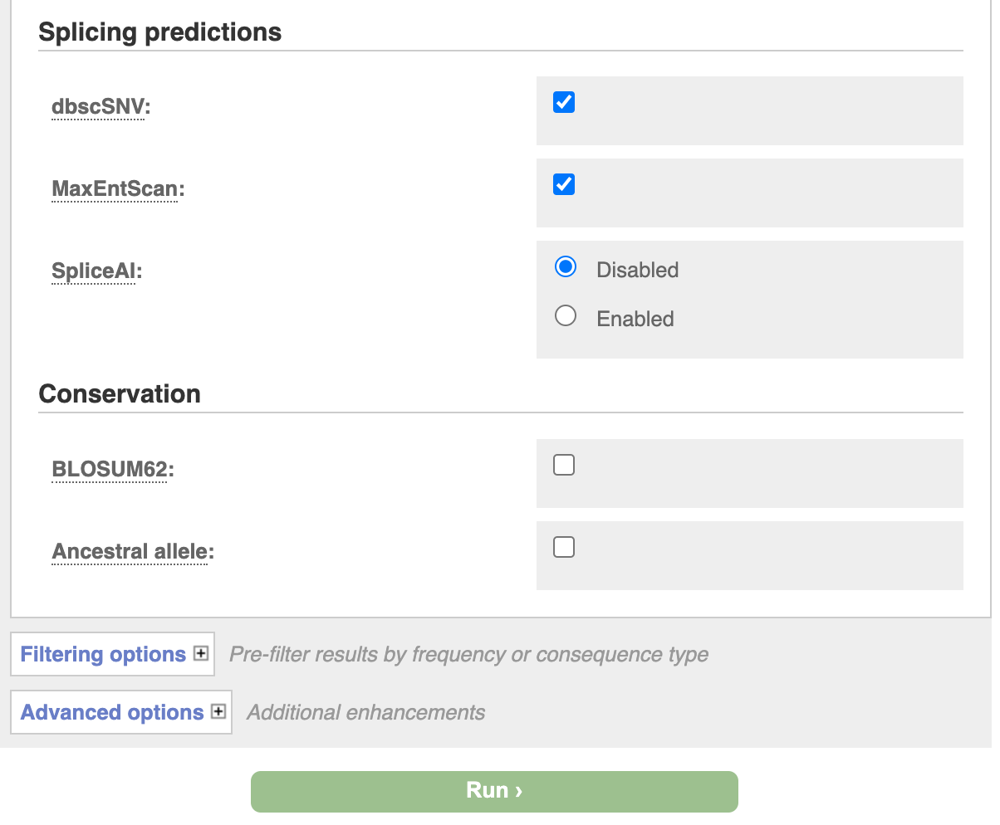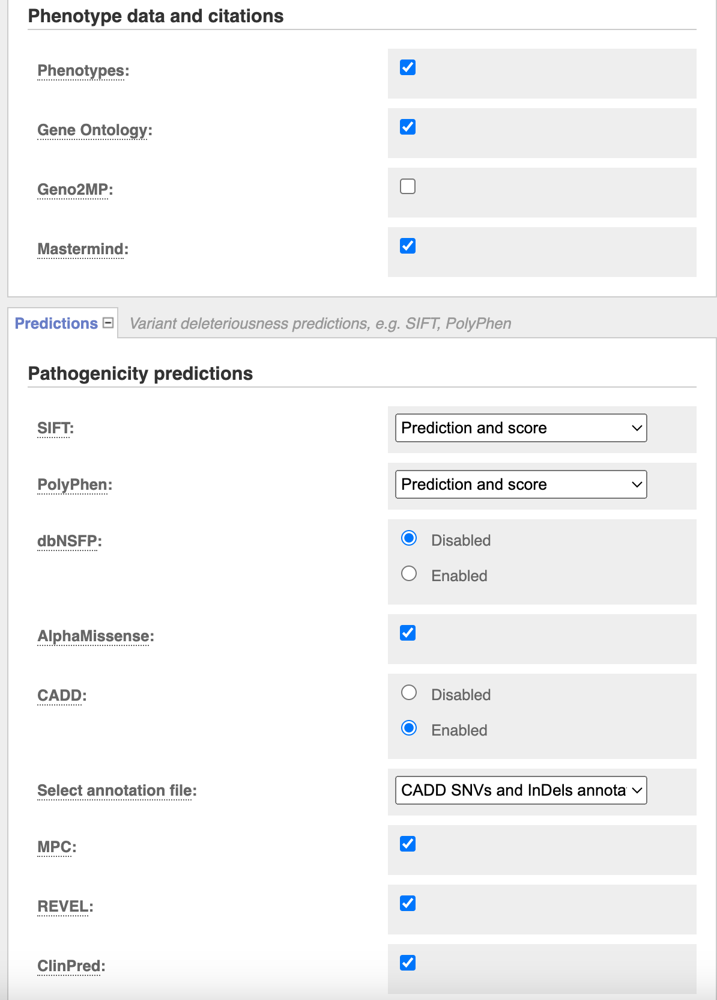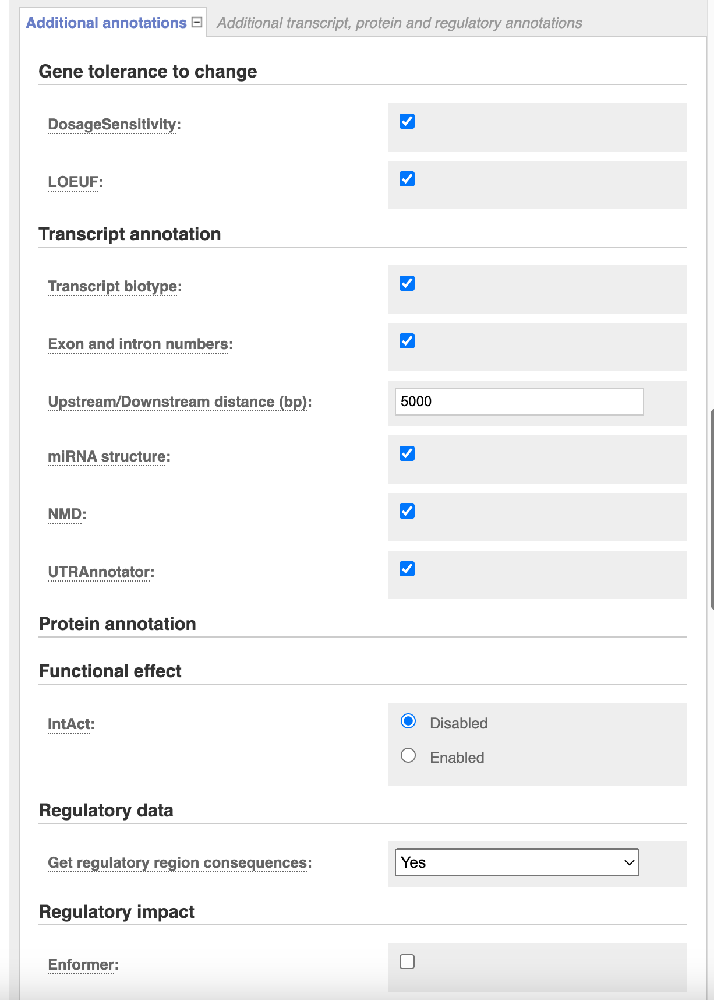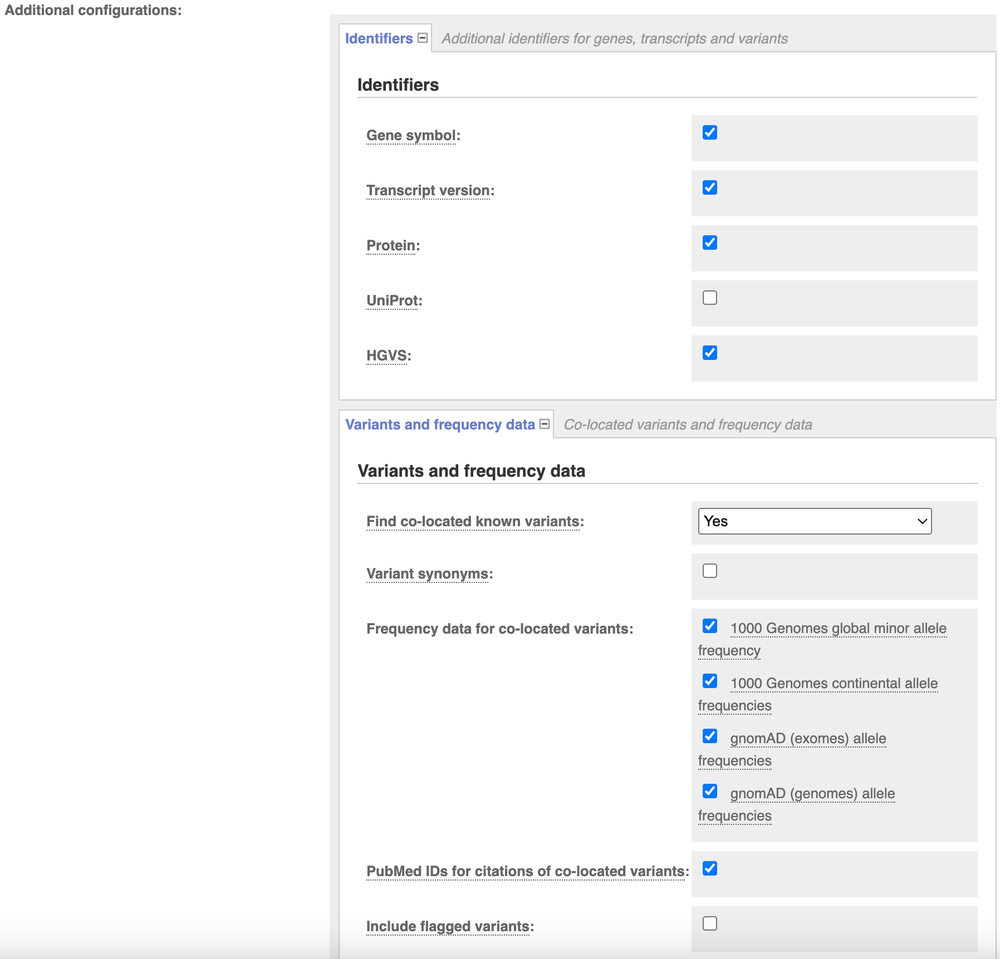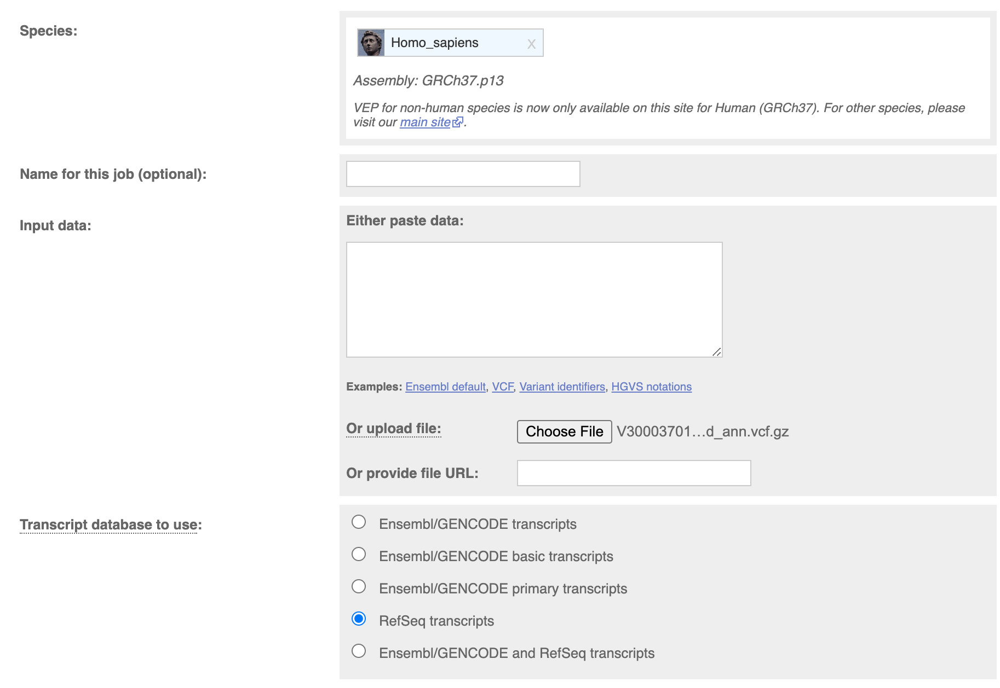

## VEP analysis of V300037010A7_haplotypecaller_filtered_snps.vcf in Homo_sapiens
https://grch37.ensembl.org/Homo_sapiens/Tools/VEP/Results?from=1;size=27;tl=0OoPQqHQXGz85Aem-10791499;to=27

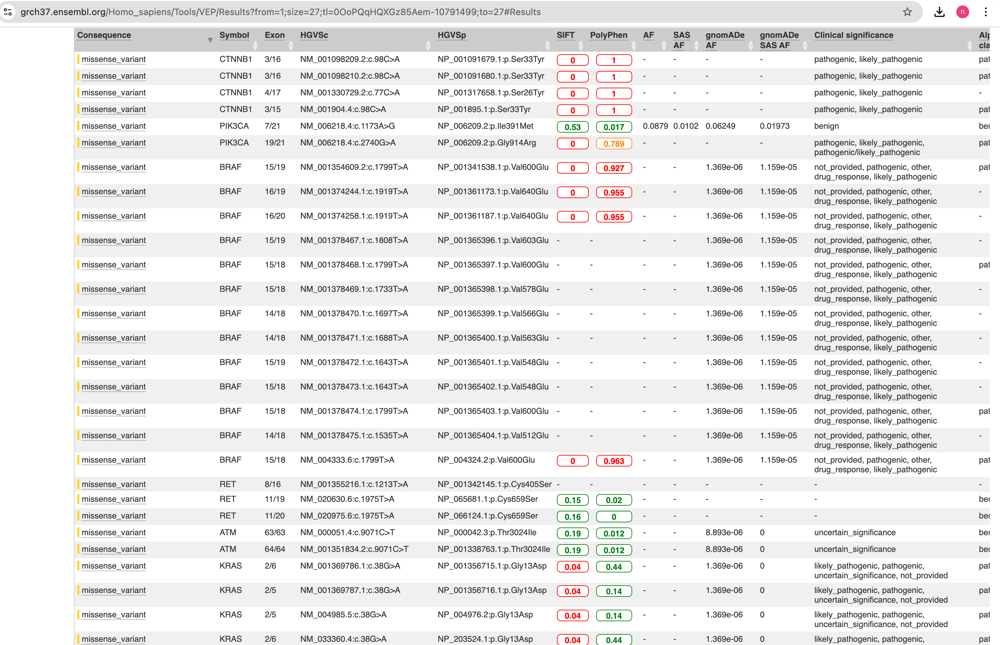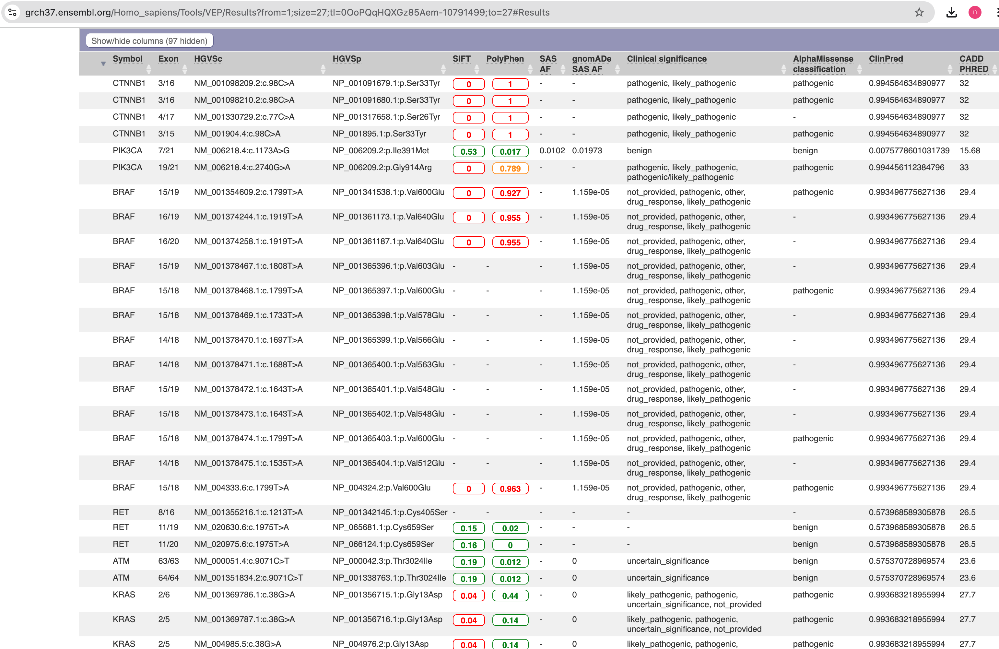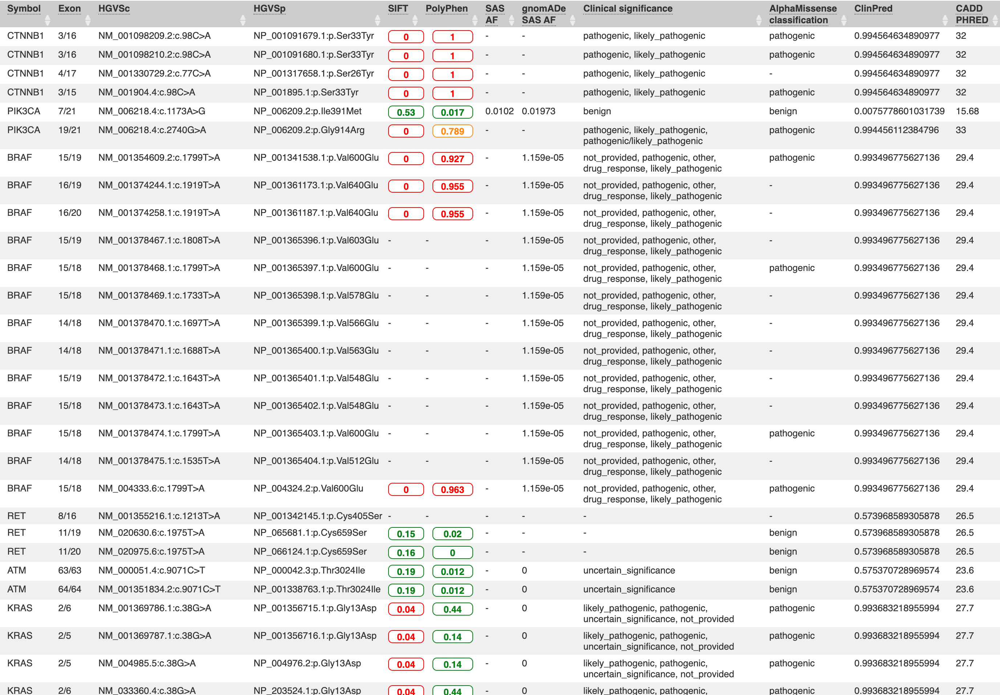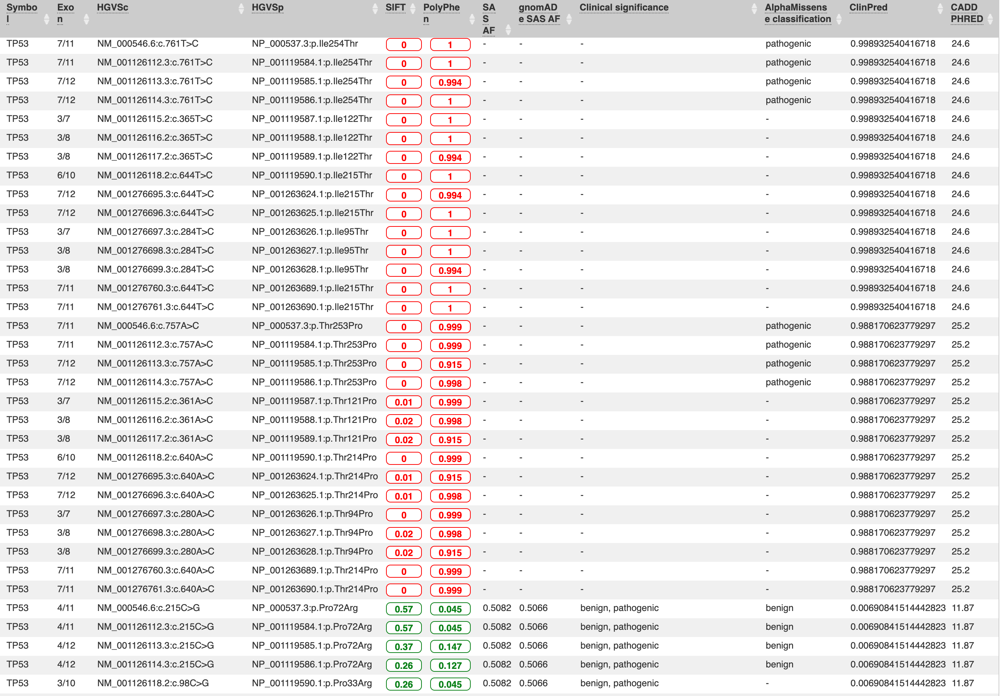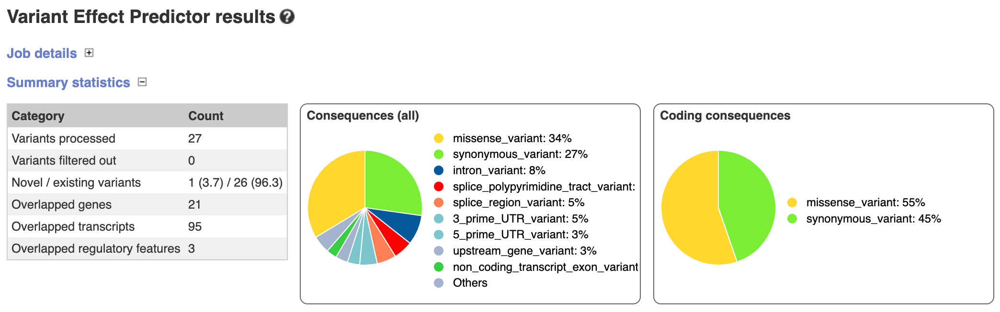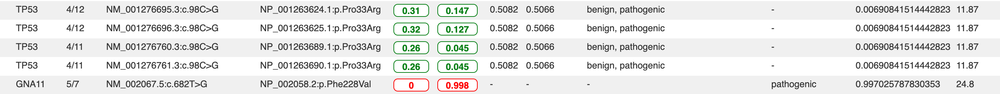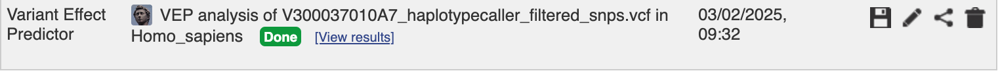

## VEP analysis of V300037010A7_haplotypecaller_snps_filtered_ann.vcf.gz in Homo_sapiens
https://grch37.ensembl.org/Homo_sapiens/Tools/VEP/Results?from=1;size=27;tl=U6X6OQT2cbRoU8rr-10791722;to=27

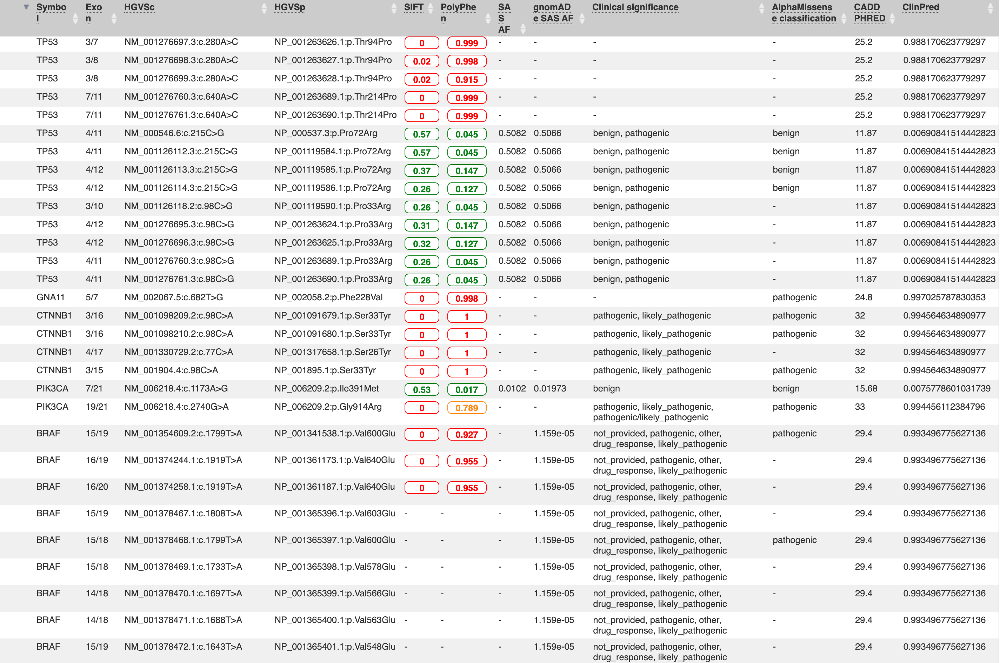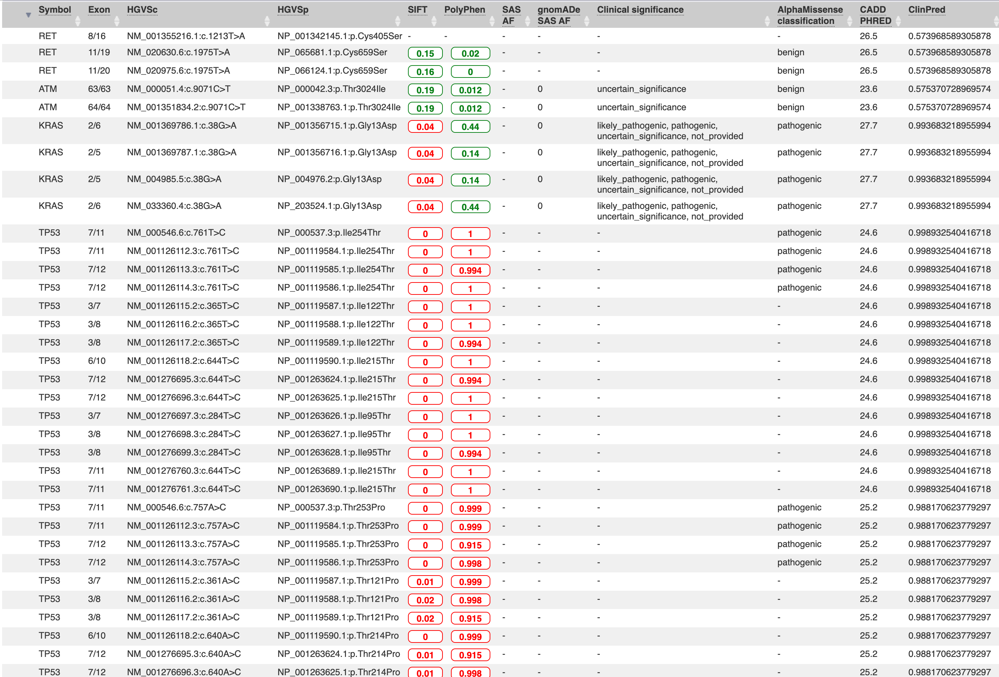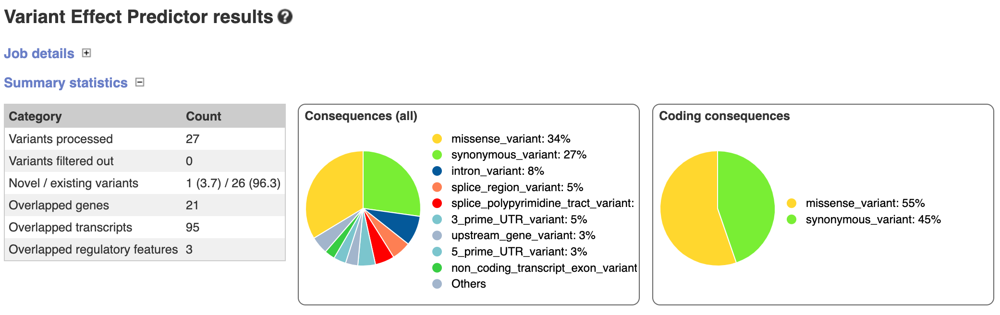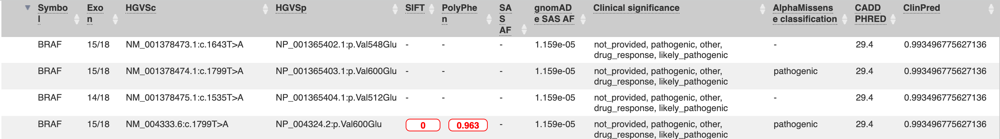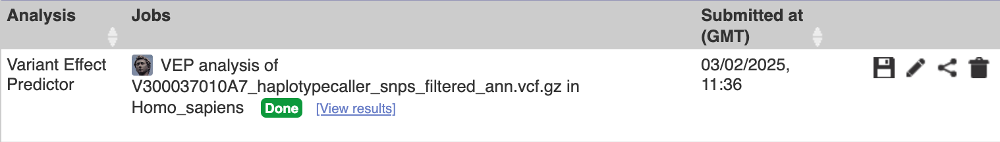